In [11]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [52]:
path_treated = "data/TERBINAFINE+/"
path_untreated = "data/TERBINAFINE- (control)/"

for file in os.listdir(path_treated):
    if file.endswith(".csv"):
        print(f"Loading file: {file}")
        df_treated = pd.read_csv(os.path.join(path_treated, file))
        break


Loading file: coordinates_highestspeed_20250318_9_3_with_time_speed.csv


In [16]:
df_treated

,GlobalFrame,Timestamp,Speed,Fragment,LocalFrame,X,Y
0,1,NaN,NaN,fragment_0,0,437.288703,379.317992
1,2,2025-03-18T14:41:54.008410,NaN,fragment_0,1,437.791111,379.808889
2,3,2025-03-18T14:41:56.000871,0.333696,fragment_0,2,437.957547,379.797170
3,4,2025-03-18T14:41:58.001852,0.337566,fragment_0,3,438.087379,379.689320
4,5,2025-03-18T14:42:00.001812,0.454892,fragment_0,4,438.313131,379.661616
...,...,...,...,...,...,...,...
75595,75596,2025-04-08T10:11:42.002000,0.225580,fragment_6_9901,10795,107.656442,297.834356
75596,75597,2025-04-08T10:11:44.001761,0.104581,fragment_6_9901,10796,107.708075,297.826087
75597,75598,2025-04-08T10:11:46.001901,0.269561,fragment_6_9901,10797,107.613497,297.730061
75598,75599,2025-04-08T10:11:48.001864,0.054257,fragment_6_9901,10798,107.586420,297.728395


In [13]:
def drop_first_row(df):
    """
    Drop the first row of the CSV file, which may contain invalid data.
    Args:
        file (str): Filename to process
        treatment_dir (str): Directory where the file is located
    """
    df["Timestamp"] = pd.to_datetime(df["Timestamp"])
    if (
        pd.isna(df.loc[0, "Timestamp"])
        or abs((df.loc[1, "Timestamp"] - df.loc[0, "Timestamp"]).total_seconds())
        > 3600
    ):
        df = df.drop(index=0).reset_index(drop=True)
    return df

def add_segment_column(df, frames_per_segment=900):
    """
    Add a 'Segment' column to each CSV file, indicating the segment number based on frame count.

    Args:
        file (str): Filename to process
        frame_per_segment (int): Number of frames per segment
    """
    num_rows = len(df)
    df["Segment"] = np.arange(num_rows) // frames_per_segment
    return df

In [54]:
df_treated = drop_first_row(df_treated)
df_treated = add_segment_column(df_treated)

In [55]:
df_treated[df_treated["Segment"]==1].head(128)

,GlobalFrame,Timestamp,Speed,Fragment,LocalFrame,X,Y,Segment
900,902,2025-03-18 20:41:54.002245,NaN,fragment_0,901,398.750000,490.000000,1
901,903,2025-03-18 20:41:56.001685,0.287169,fragment_0,902,398.838710,490.112903,1
902,904,2025-03-18 20:41:58.001790,1.777107,fragment_0,903,398.024691,490.469136,1
903,905,2025-03-18 20:42:00.001958,1.434248,fragment_0,904,397.375000,490.772727,1
904,906,2025-03-18 20:42:02.001713,0.611324,fragment_0,905,397.649485,490.907216,1
...,...,...,...,...,...,...,...,...
1023,1025,2025-03-18 20:46:00.001976,0.338648,fragment_0,1024,397.459459,491.229730,1
1024,1026,2025-03-18 20:46:02.001805,0.000000,fragment_0,1025,397.459459,491.229730,1
1025,1027,2025-03-18 20:46:04.001889,275.576854,fragment_0,1026,511.631579,568.368421,1
1026,1028,2025-03-18 20:46:06.001868,1.710526,fragment_0,1027,511.421053,569.197368,1


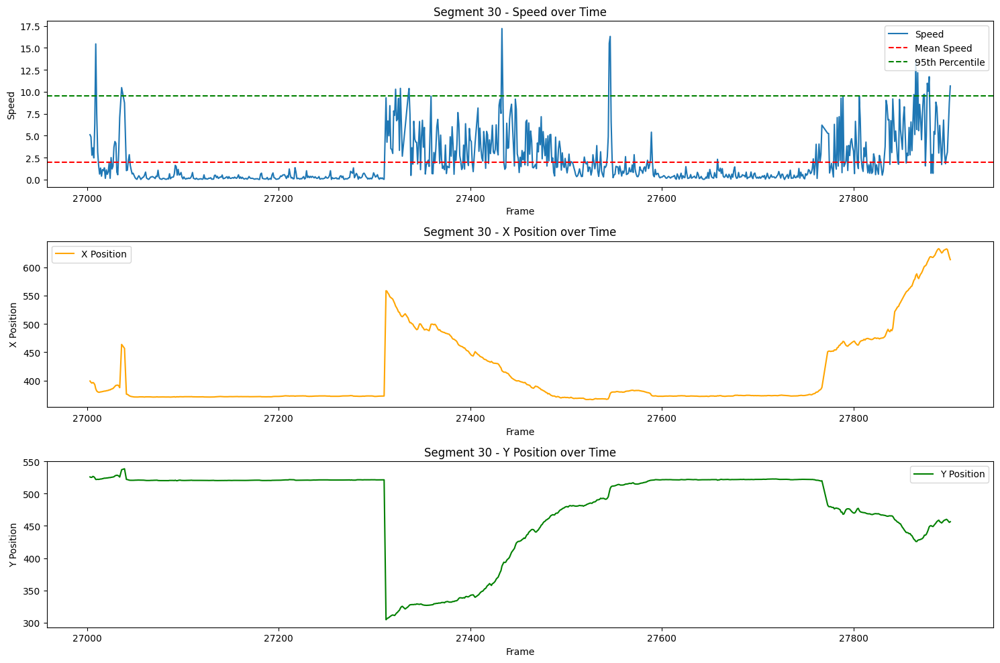

In [126]:
# Plot the speed, the X and Y positions over time for one segment, and clip the speed at 50
segment_number =30

df_segment = df_treated[df_treated["Segment"] == segment_number]
df_segment = df_segment[df_segment["Speed"] < 50]
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.plot(df_segment["GlobalFrame"], df_segment["Speed"], label="Speed")
# rajoute une barre horizontale à la moyenne de la vitesse et sa valeur
plt.axhline(y=df_segment["Speed"].mean(), color='r', linestyle='--', label='Mean Speed')
plt.axhline(y=df_segment["Speed"].quantile(0.98), color='g', linestyle='--', label='95th Percentile')
plt.xlabel("Frame")
plt.ylabel("Speed")
plt.title(f"Segment {segment_number} - Speed over Time")
plt.legend()
plt.subplot(3, 1, 2)
plt.plot(df_segment["GlobalFrame"], df_segment["X"], label="X Position", color='orange')
plt.xlabel("Frame")
plt.ylabel("X Position")
plt.title(f"Segment {segment_number} - X Position over Time")
plt.legend()
plt.subplot(3, 1, 3)
plt.plot(df_segment["GlobalFrame"], df_segment["Y"], label="Y Position", color='green')
plt.xlabel("Frame")
plt.ylabel("Y Position")
plt.title(f"Segment {segment_number} - Y Position over Time")
plt.legend()
plt.tight_layout()
plt.show()

In [102]:
path_treated = "data/TERBINAFINE+/"
path_untreated = "data/TERBINAFINE- (control)/"

def filter_speed_outliers(df, speed_col='Speed', pct95=10, pct99=50, tolerance=0.3):
    """
    Détecte et nettoie les vitesses aberrantes selon 3 critères :
        1) > 99e percentile (outliers extrêmes)
        2) > 95e percentile mais << voisins (pic isolé)
        3) pics isolés relatifs (méthode tolerance)
    
    Args:
        df: DataFrame contenant au moins la colonne speed_col
        speed_col: nom de la colonne de vitesse
        pct95: seuil 95e percentile estimé (valeur typique maximale)
        pct99: seuil 99e percentile estimé (limite haute raisonnable)
        tolerance: pour détecter des pics isolés (ex : 0.5 = voisins < 50% du pic)
    
    Returns:
        df_corr: DataFrame avec NaN sur les vitesses aberrantes
        mask_outliers: masque booléen indiquant les outliers détectés
    """

    speeds = df[speed_col].values
    n = len(speeds)
    outlier = np.zeros(n, dtype=bool)

    for i in range(1, n-1):
        cur = speeds[i]
        prev = speeds[i-1]
        nxt = speeds[i+1]

        # --- Critère 1 : outlier extrême (au-dessus du 99e percentil) ---
        if cur > pct99:
            outlier[i] = True
            continue

        # --- Critère 2 : vitesse suspecte (entre 95e et 99e) ---
        if cur > pct95:
            # si c'est un pic isolé (voisins beaucoup plus faibles)
            if (prev < cur * tolerance) or (nxt < cur * tolerance):
                print(f"Isolated spike detected at index {i} with speed {cur} in {df["Segment"].iloc[0]} segment")
                print(f"  Neighbors: prev={prev}, next={nxt}")
                print("-------------------------------")
                outlier[i] = True

    # Correction : remplacer les outliers par NaN
    df_corr = df.copy()
    df_corr.loc[outlier, speed_col] = np.nan

    return df_corr, outlier

# Application
# df = filter_isolated_spikes(df, threshold=150)

all_speeds_treated = []
all_speeds_control = []
os.makedirs("test/cleaned_control/", exist_ok=True)
os.makedirs("test/cleaned_treated/", exist_ok=True)

for file in os.listdir(path_treated):
    if file.endswith(".csv"):
        print(f"Processing {file} in treated group")
        df = pd.read_csv(os.path.join(path_treated, file))
        df = drop_first_row(df)
        df = add_segment_column(df)
        for segment in df['Segment'].unique():
            df_segment = df[df['Segment'] == segment]
            df_segment, _ = filter_speed_outliers(df_segment)
            df.loc[df_segment.index, 'Speed'] = df_segment['Speed']
        df.to_csv(os.path.join("test/cleaned_treated/", file), index=False)
        all_speeds_treated.append(df['Speed'].values)
for file in os.listdir(path_untreated):
    if file.endswith(".csv"):
        print(f"Processing {file} in control group")
        df = pd.read_csv(os.path.join(path_untreated, file))
        df = drop_first_row(df)
        df = add_segment_column(df)
        for segment in df['Segment'].unique():
            df_segment = df[df['Segment'] == segment]
            df_segment, _ = filter_speed_outliers(df_segment)
            df.loc[df_segment.index, 'Speed'] = df_segment['Speed']
        all_speeds_control.append(df['Speed'].values)
        df.to_csv(os.path.join("test/cleaned_control/", file), index=False)


Processing coordinates_highestspeed_20250318_9_3_with_time_speed.csv in treated group
Isolated spike detected at index 11 with speed 16.477532860325834 in 0 segment
  Neighbors: prev=1.393425590347248, next=12.532949301046298
-------------------------------
Isolated spike detected at index 12 with speed 12.532949301046298 in 0 segment
  Neighbors: prev=16.477532860325834, next=2.517489489454171
-------------------------------
Isolated spike detected at index 127 with speed 11.854064792913432 in 1 segment
  Neighbors: prev=1.7105263157894537, next=6.443014780267678
-------------------------------
Isolated spike detected at index 131 with speed 15.96674857811439 in 1 segment
  Neighbors: prev=11.81887014752293, next=2.471920298671206
-------------------------------
Isolated spike detected at index 133 with speed 27.754875281451746 in 1 segment
  Neighbors: prev=2.471920298671206, next=7.08712425306306
-------------------------------
Isolated spike detected at index 136 with speed 22.0034

99th percentile = 5.19085230402745


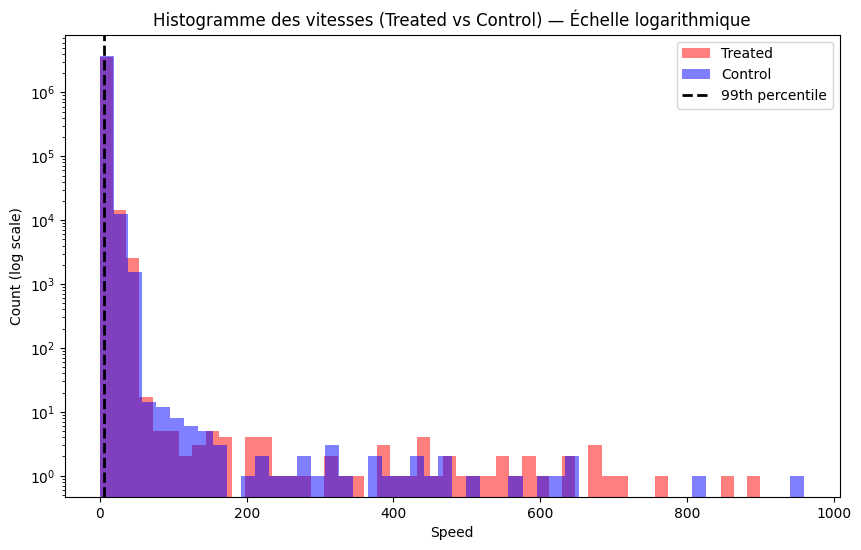

In [103]:
plt.figure(figsize=(10, 6))

# Histogramme des vitesses traitées
plt.hist(
    np.concatenate(all_speeds_treated),
    bins=50,
    alpha=0.5,
    color='red',
    label='Treated'
)

# Histogramme des vitesses contrôle
plt.hist(
    np.concatenate(all_speeds_control),
    bins=50,
    alpha=0.5,
    color='blue',
    label='Control'
)

# Calcul du 95e percentile global
all_speeds = np.concatenate([
    np.concatenate(all_speeds_treated),
    np.concatenate(all_speeds_control)
])
# Retirer les NaN
all_speeds = all_speeds[~np.isnan(all_speeds)]

p99 = np.percentile(all_speeds, 95)
print("99th percentile =", p99)
# Ligne verticale
plt.axvline(p99, color='black', linestyle='--', linewidth=2, label='99th percentile')

plt.yscale('log')
plt.xlabel("Speed")
plt.ylabel("Count (log scale)")
plt.title("Histogramme des vitesses (Treated vs Control) — Échelle logarithmique")
plt.legend()
plt.show()


In [104]:
path_treated_test = "test/cleaned_treated/"
path_untreated_test = "test/cleaned_control/"

for file in os.listdir(path_treated_test):
    if file.endswith(".csv"):
        print(f"Loading file: {file}")
        df_treated = pd.read_csv(os.path.join(path_treated_test, file))
        break


Loading file: coordinates_highestspeed_20250318_9_3_with_time_speed.csv


In [105]:
df_treated.head()

,GlobalFrame,Timestamp,Speed,Fragment,LocalFrame,X,Y,Segment
0,2,2025-03-18 14:41:54.008410,NaN,fragment_0,1,437.791111,379.808889,0
1,3,2025-03-18 14:41:56.000871,0.333696,fragment_0,2,437.957547,379.797170,0
2,4,2025-03-18 14:41:58.001852,0.337566,fragment_0,3,438.087379,379.689320,0
3,5,2025-03-18 14:42:00.001812,0.454892,fragment_0,4,438.313131,379.661616,0
4,6,2025-03-18 14:42:02.001772,0.335773,fragment_0,5,438.196970,379.782828,0


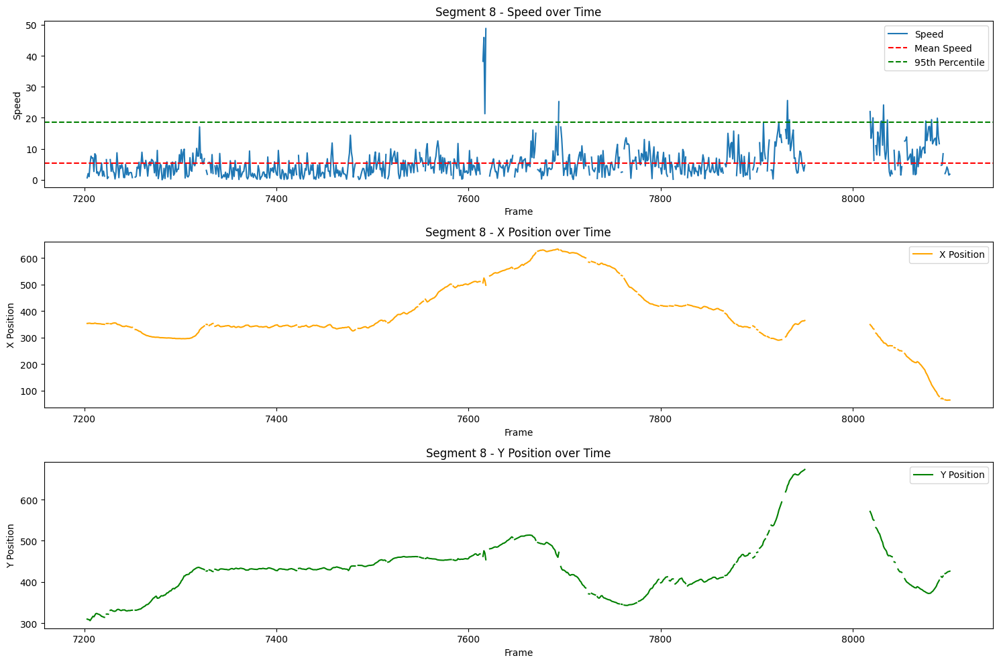

In [115]:
# Plot the speed, the X and Y positions over time for one segmen
segment_number =8

df_segment = df_treated[df_treated["Segment"] == segment_number]
# Si speed est nan alors on remplace X et Y par nan aussi 
df_segment.loc[df_segment["Speed"].isna(), ["X", "Y"]] = np.nan
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.plot(df_segment["GlobalFrame"], df_segment["Speed"], label="Speed")
# rajoute une barre horizontale à la moyenne de la vitesse et sa valeur
plt.axhline(y=df_segment["Speed"].mean(), color='r', linestyle='--', label='Mean Speed')
plt.axhline(y=df_segment["Speed"].quantile(0.98), color='g', linestyle='--', label='95th Percentile')
plt.xlabel("Frame")
plt.ylabel("Speed")
plt.title(f"Segment {segment_number} - Speed over Time")
plt.legend()
plt.subplot(3, 1, 2)
plt.plot(df_segment["GlobalFrame"], df_segment["X"], label="X Position", color='orange')
plt.xlabel("Frame")
plt.ylabel("X Position")
plt.title(f"Segment {segment_number} - X Position over Time")
plt.legend()
plt.subplot(3, 1, 3)
plt.plot(df_segment["GlobalFrame"], df_segment["Y"], label="Y Position", color='green')
plt.xlabel("Frame")
plt.ylabel("Y Position")
plt.title(f"Segment {segment_number} - Y Position over Time")
plt.legend()
plt.tight_layout()
plt.show()

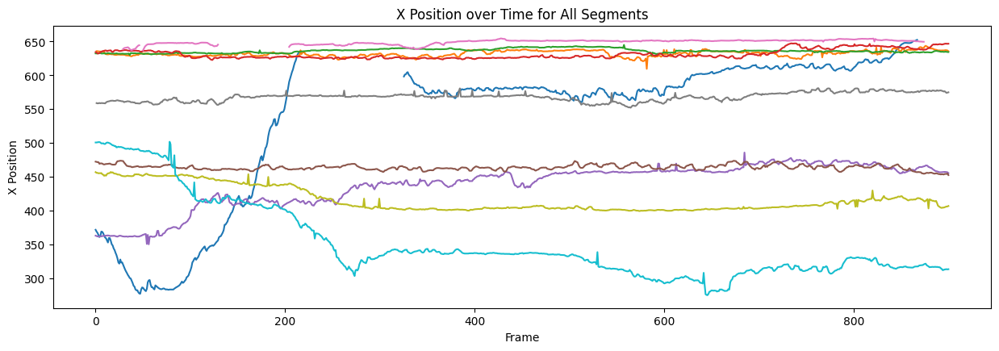

In [122]:
# Plotnall the position for each segments on the same plot en fonction du temps. Chacun a des échelles x de 900 frames donc les grpahiques doivent se superposer correctement
plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)
for segment_number in df_treated["Segment"].unique()[10:20]:
    df_segment = df_treated[df_treated["Segment"] == segment_number]
    plt.plot(np.linspace(0, 900, len(df_segment)), df_segment["X"], label=f"Segment {segment_number}")
plt.xlabel("Frame")
plt.ylabel("X Position")
plt.title("X Position over Time for All Segments")  
plt.show()

In [9]:
import pandas as pd
import numpy as np
import glob
import os
import warnings
warnings.filterwarnings("ignore")

def get_global_stats(file_list):
    """
    Parcourt un échantillon de fichiers pour déterminer les seuils physiologiques (P99).
    """
    all_dx = []
    all_dy = []
    all_speeds = []
    
    print("Calcul des statistiques globales en cours...")
    
    # On prend un échantillon (ex: 20 fichiers au hasard) ou tous si possible
    for file in file_list: 
        df = pd.read_csv(file) # Adapte le séparateur si besoin (sep=';' ou ',')
        
        # Calcul des deltas si pas déjà présents
        if 'dx' not in df.columns:
            df['dx'] = df['X'].diff().abs()
            df['dy'] = df['Y'].diff().abs()
        
        # On accumule les valeurs valides (sans NaN)
        all_dx.extend(df['dx'].dropna().values)
        all_dy.extend(df['dy'].dropna().values)
        all_speeds.extend(df['Speed'].dropna().values)

    
    # Calcul des percentiles
    stats = {
        'dx_p95': np.percentile(all_dx, 95),
        'dy_p95': np.percentile(all_dy, 95),
        'dx_max_limit': np.percentile(all_dx, 99) * 1.25, # Marge de sécurité (Hard Limit)
        'dy_max_limit': np.percentile(all_dy, 99) * 1.25,
    }
    
    return stats

global_stats = get_global_stats(glob.glob("data/TERBINAFINE+/*.csv") + glob.glob("data/TERBINAFINE- (control)/*.csv"))

Calcul des statistiques globales en cours...


In [129]:
print(global_stats)

{'dx_p95': np.float64(2.2919087880759785), 'dy_p95': np.float64(2.351968721031623), 'speed_95': np.float64(6.874450753983331), 'dx_max_limit': np.float64(18.886715149769667), 'dy_max_limit': np.float64(21.580116222301893), 'speed_max_limit': np.float64(62.5692298921355)}


In [8]:
def clean_column_outliers(series, hard_limit, soft_limit, tolerance=0.5):
    """
    Nettoie une série (dx ou dy) avec Hard Cut + Spike Detection.
    Renvoie la série avec des NaN à la place des outliers.
    """
    values = series.values
    is_outlier = np.zeros(len(values), dtype=bool)
    
    # 1. Vecteurs décalés pour comparer aux voisins
    prev_val = series.shift(1).fillna(0).values
    next_val = series.shift(-1).fillna(0).values
    
    # --- Critère A : Hard Limit (Impossible physiquement) ---
    mask_hard = (values > hard_limit)
    
    # --- Critère B : Spike (Pic isolé dans la zone grise) ---
    # Si valeur > soft_limit ET voisins < tolerance * valeur
    mask_spike = (
        (values > soft_limit) & 
        (prev_val < values * tolerance) & 
        (next_val < values * tolerance)
    )
    
    # Fusion des masques
    total_mask = mask_hard | mask_spike
    
    # Remplacement par NaN
    clean_series = series.copy()
    clean_series[total_mask] = np.nan
    
    return clean_series


def smart_gap_fill(df, x_col='X', y_col='Y', max_speed_per_frame=50, max_gap_frames=5):
    """
    Remplit les trous (NaN) dans x et y SEULEMENT si le saut est physiquement possible.
    
    Args:
        max_speed_per_frame: Vitesse max autorisée (ton P99 ou HardLimit)
        max_gap_frames: Taille max du trou à essayer de combler (ex: 300s = 150 frames)
    """
    df = df.copy()
    
    # On identifie les blocs de NaN sur x (supposons que x et y ont les mêmes trous)
    is_na = df[x_col].isna()
    
    # Astuce pour grouper les NaNs consécutifs
    # On crée un ID unique pour chaque "groupe" de lignes
    groups = (is_na != is_na.shift()).cumsum()
    
    # On itère sur chaque groupe qui contient des NaNs
    for group_id, group_data in df[is_na].groupby(groups):
        
        gap_size = len(group_data)
        
        # 1. Si le trou est TROP GRAND -> On laisse tomber direct
        if gap_size > max_gap_frames:
            continue # Reste NaN
            
        # 2. Récupérer les bornes du trou (Start et End)
        idx_start = group_data.index[0] - 1
        idx_end = group_data.index[-1] + 1
        
        # Vérifier qu'on n'est pas au début ou à la fin du fichier
        if idx_start < df.index[0] or idx_end > df.index[-1]:
            continue 

        # Coordonnées avant et après le trou
        p_start = df.loc[idx_start, [x_col, y_col]]
        p_end = df.loc[idx_end, [x_col, y_col]]
        
        # Si les bornes sont elles-mêmes NaN (trou adjacent), on ne peut pas interpoler
        if p_start.isna().any() or p_end.isna().any():
            continue

        # 3. VERIFICATION PHYSIQUE
        # Distance euclidienne réelle à parcourir
        dist_needed = np.sqrt((p_end[x_col] - p_start[x_col])**2 + (p_end[y_col] - p_start[y_col])**2)
        
        # Distance max théorique que le ver PEUT faire pendant ce temps
        # Gap size + 1 car il faut compter le temps de trajet total
        max_possible_dist = max_speed_per_frame * (gap_size + 1)
        
        if dist_needed <= max_possible_dist:
            # C'EST POSSIBLE ! On lance l'interpolation sur ce segment précis
            # On prend la slice incluant les bornes pour que l'interpolation s'accroche bien
            subset_idx = range(idx_start, idx_end + 1)
            df.loc[subset_idx, [x_col, y_col]] = df.loc[subset_idx, [x_col, y_col]].interpolate(method='linear')
        
        # Sinon (else): On ne fait rien, les NaN restent des NaN.
            
    return df

def rename_file(file_name, treatment, treatment_dir):
    """
    Rename files according to worm ID to ensure consistency with lifespan_summary.csv

    Args:
        file (str): Original filename
        treatment (str): Treatment group
        treatment_dir (str): Directory to save renamed files
    """
    if file_name.endswith(".csv"):
        parts = file_name.split("_")
        if len(str(parts[3])) == 1:
            parts[3] = "0" + str(parts[3])
        worm_id = f"{parts[2]}_piworm{parts[3]}_{parts[4]}"
        return worm_id.split(".csv")[0]
    
def calculate_angular_velocity(df, dx_col='dx_clean', dy_col='dy_clean'):
    """
    Calcule la vitesse angulaire (changement de direction) en radians/frame.
    """
    # 1. Calcul de l'angle de cap (Heading) pour chaque point
    # arctan2 gère correctement les 4 quadrants
    angles = np.arctan2(df[dy_col], df[dx_col])
    
    # 2. "Déroulage" (Unwrap) pour éviter les sauts brutaux pi/-pi
    # Ex: passer de 3.14 à -3.14 devient passer de 3.14 à 3.15
    angles_unwrapped = np.unwrap(angles)
    
    # 3. Calcul de la différence (Vitesse angulaire)
    # On met 0 pour la première valeur qui n'a pas de précédent
    angular_velocity = np.concatenate(([0], np.diff(angles_unwrapped)))
    
    # 4. Absolu ? 
    # Souvent, on veut savoir "combien il tourne", peu importe gauche/droite.
    # Pour Rocket, garder le signe (+/-) est mieux : il saura distinguer "tourne en rond" de "zig-zag"
    return angular_velocity

In [14]:
files = glob.glob("data/TERBINAFINE+/*.csv") + glob.glob("data/TERBINAFINE- (control)/*.csv")
global_stats = get_global_stats(files)
HARD_LIMIT_DX = global_stats['dx_max_limit']
HARD_LIMIT_DY = global_stats['dy_max_limit']
SOFT_LIMIT_DX = global_stats['dx_p95']
SOFT_LIMIT_DY = global_stats['dy_p95']
print(global_stats)
TREATMENT = ["TERBINAFINE+", "TERBINAFINE- (control)"]
OUTPUT_DIRECTORY = "test/"
os.makedirs(OUTPUT_DIRECTORY + "TERBINAFINE+/" , exist_ok=True)
os.makedirs(OUTPUT_DIRECTORY + "TERBINAFINE- (control)/" , exist_ok=True)
lifespan_summary = pd.read_csv("data/lifespan_summary.csv")

for treatment in TREATMENT:
    files = glob.glob(f"data/{treatment}/*.csv")
    print(files)
    for file in files:
        print(f"Traitement de {os.path.basename(file)}...")
        df = pd.read_csv(file)
        df = drop_first_row(df)
        df = add_segment_column(df)
        worm_id = rename_file(os.path.basename(file), treatment, OUTPUT_DIRECTORY)
        print(worm_id)
        frame_of_death = lifespan_summary.loc[
            lifespan_summary["Filename"] == "/" + worm_id, "LifespanInFrames"
        ].values[0]
        df = df[df["GlobalFrame"] <= frame_of_death].copy()
        for segment in df['Segment'].unique():
            df_segment = df[df['Segment'] == segment].copy()
            # A. Calculer dx/dy bruts si absents
            df_segment['dx'] = df_segment['X'].diff().abs()
            df_segment['dy'] = df_segment['Y'].diff().abs()        
            # B. DÉTECTION OUTLIERS (On nettoie dx et dy indépendamment)
            clean_dx = clean_column_outliers(df_segment['dx'], HARD_LIMIT_DX, SOFT_LIMIT_DX)
            clean_dy = clean_column_outliers(df_segment['dy'], HARD_LIMIT_DY, SOFT_LIMIT_DY)     

            # C. PROPAGATION DES OUTLIERS SUR X et Y
            # Si dx est faux, alors x est faux (et probablement y aussi à cet instant)
            is_bad_dx = clean_dx.isna() & df_segment['dx'].notna()
            is_bad_dy = clean_dy.isna() & df_segment['dy'].notna()
            mask_bad_movement = is_bad_dx | is_bad_dy
            
            if mask_bad_movement.any():
                print(f"  Segment {segment}: {mask_bad_movement.sum()} points supprimés (Aberrations).")
                df_segment.loc[mask_bad_movement, ['X', 'Y']] = np.nan      
            
            # D. SMART GAP FILLING (Le coeur de ta stratégie)
            # On essaie de boucher les trous de X et Y si physiquement possible
            # max_speed_per_frame = La limite physique (Hard Limit)
            df_segment = smart_gap_fill(df_segment, max_speed_per_frame=max([HARD_LIMIT_DX, HARD_LIMIT_DY]), max_gap_frames=5)
            
            # E. RECALCUL FINAL PROPRE
            # Maintenant que X et Y sont propres et interpolés (ou NaN), on recalcul tout
            df_segment['dx_clean'] = df_segment['X'].diff().abs()
            df_segment['dy_clean'] = df_segment['Y'].diff().abs()
            # Recalcul de la vitesse (Pythagore) / temps (2s)
            df_segment['speed_clean'] = np.sqrt(df_segment['dx_clean']**2 + df_segment['dy_clean']**2) / 2.0

            dx_signed = df_segment['X'].diff().fillna(0)
            dy_signed = df_segment['Y'].diff().fillna(0)

            # On utilise numpy directement
            angles = np.arctan2(dy_signed, dx_signed)
            angles_unwrap = np.unwrap(angles)
            # On calcule la dérivée (vitesse de rotation)
            df_segment['angular_v'] = np.concatenate(([0], np.diff(angles_unwrap)))

            # On remplace les NaN éventuels par 0 (pas de rotation)
            df_segment['angular_v'] = df_segment['angular_v'].fillna(0)
            df.loc[df_segment.index, ['dx_clean', 'dy_clean', 'speed_clean', 'X', 'Y', 'angular_v']] = df_segment[['dx_clean', 'dy_clean', 'speed_clean', 'X', 'Y', 'angular_v']]
        # F. SAUVEGARDE
        df["worm_id"] = [worm_id] * len(df)
        df["terbinafine"] = [True if treatment == "TERBINAFINE+" else False] * len(df)
        output_path = os.path.join(OUTPUT_DIRECTORY, treatment, f"{worm_id}.csv")
        df.to_csv(output_path, index=False)

Calcul des statistiques globales en cours...
{'dx_p95': np.float64(2.2919087880759785), 'dy_p95': np.float64(2.351968721031623), 'dx_max_limit': np.float64(18.886715149769667), 'dy_max_limit': np.float64(21.580116222301893)}
['data/TERBINAFINE+/coordinates_highestspeed_20250318_9_3_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20240924_11_4_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20250318_9_2_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20240924_11_5_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20240924_11_6_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20250318_9_1_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20250318_11_5_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20250311_17_5_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20240924_11_1_with_time_speed.csv', 'data/TERBINAFINE+/coordinates_highestspeed_20250318_9_6_

In [2]:
import numpy as np
import pandas as pd
import glob
import os
from sklearn.model_selection import GroupShuffleSplit

def extract_clips_multivariate(df_data, window_size=150, stride=150):
    """
    Extrait des clips multivariés (ex: Vitesse + Angle).
    Args:
        df_data: DataFrame (N_temps, N_features)
    Returns:
        clips: Liste d'arrays numpy de forme (N_features, N_temps)
    """
    clips = []
    
    # 1. Identifier les blocs de données valides (sans AUCUN NaN dans aucune colonne)
    # .all(axis=1) signifie : la ligne est valide seulement si Vitesse ET Angle sont là.
    is_valid = df_data.notna().all(axis=1)
    
    # Création d'ID pour chaque bloc continu
    blocks = (is_valid != is_valid.shift()).cumsum()
    
    # 2. Itérer sur chaque bloc continu
    for block_id, data_block in df_data.groupby(blocks):
        
        # Si le bloc contient un NaN n'importe où, on saute
        if data_block.isna().any().any():
            continue
            
        # Si le bloc est trop court
        if len(data_block) < window_size:
            continue
            
        # 3. Découper ce bloc propre en clips
        # data_block.values est de forme (Length, Channels) -> ex: (150, 2)
        values = data_block.values
        
        for i in range(0, len(values) - window_size + 1, stride):
            clip = values[i : i + window_size]
            
            # CRUCIAL : MiniRocket veut (Channels, Length).
            # On doit transposer (.T) pour passer de (150, 2) à (2, 150)
            clips.append(clip.T)
            
    return clips

def build_dataset_strict(data_dir, window_size=150, stride=150, feature_cols=['speed_clean', 'angular_v']):
    """
    Construit le dataset multivarié X, y, groups.
    Args:
        feature_cols: Liste des colonnes à utiliser (Vitesse, Rotation, etc.)
    """
    X = []
    y = []
    groups = [] # ID du ver
    
    # Correction : On utilise data_dir pour chercher les fichiers
    # On cherche récursivement ou directement dans le dossier
    files = glob.glob("test/TERBINAFINE+/*.csv") + glob.glob("test/TERBINAFINE- (control)/*.csv")
    
    print(f"Analyse de {len(files)} fichiers dans {data_dir}...")
    print(f"Features utilisées : {feature_cols}")
    
    for file_path in files:
        try:
            df = pd.read_csv(file_path)
            
            # --- 1. RECUPERATION DES METADONNEES ---
            # Vérification basique
            if "terbinafine" not in df.columns or "worm_id" not in df.columns:
                print(f"Skipping {os.path.basename(file_path)} (Colonnes manquantes)")
                continue
            
            # Vérification que les features existent (ex: angular_v)
            if not all(col in df.columns for col in feature_cols):
                print(f"Skipping {os.path.basename(file_path)} (Features manquantes)")
                continue

            # Label : 1 si Terbinafine (True), 0 sinon
            # On gère le cas où c'est un booléen ou une string
            val = df["terbinafine"].iloc[0]
            label = 1 if (val == True or str(val).lower() == 'true') else 0
            
            worm_id = df["worm_id"].iloc[0]
            
            # --- 2. TRAITEMENT PAR SEGMENT ---
            for segment_id, df_segment in df.groupby("Segment"):
                
                # On extrait les clips sur les colonnes demandées
                clean_clips = extract_clips_multivariate(
                    df_segment[feature_cols], 
                    window_size=window_size, 
                    stride=stride
                )
                
                # Ajout aux listes globales
                for clip in clean_clips:
                    X.append(clip)
                    y.append(label)
                    groups.append(worm_id)
                
        except Exception as e:
            print(f"Erreur sur {file_path}: {e}")

    # --- 3. TRANSFORMATION FINALE ---
    if len(X) == 0:
        print("ALERTE : Aucun clip trouvé ! Vérifiez vos noms de colonnes ou le dossier.")
        return None, None, None

    # X est une liste d'arrays (2, 150)
    X_arr = np.array(X) 
    # La shape est déjà correcte grâce au .T dans extract : (N_samples, N_channels, Length)
    
    y_arr = np.array(y)
    groups_arr = np.array(groups)
    
    print(f"Dataset généré : {X_arr.shape}") # Devrait afficher (N, 2, 150)
    print(f"Distribution : {np.sum(y_arr==0)} Controls vs {np.sum(y_arr==1)} Treated")
    
    return X_arr, y_arr, groups_arr

# --- EXECUTION ---
# Assure-toi que le dossier pointé contient bien les CSV avec 'angular_v'
# Note : stride=75 pour avoir 50% de chevauchement (Data Augmentation)
X, y, groups = build_dataset_strict(
    "test/test", 
    window_size=150, 
    stride=150, 
    feature_cols=['speed_clean', 'angular_v']
)

Analyse de 104 fichiers dans test/test...
Features utilisées : ['speed_clean', 'angular_v']
Dataset généré : (38025, 2, 150)
Distribution : 19100 Controls vs 18925 Treated


In [3]:
# Count the number of segments in total dataset
total_segments = 0
files = glob.glob("test/TERBINAFINE+/*.csv") + glob.glob("test/TERBINAFINE- (control)/*.csv")
for file_path in files:
    df = pd.read_csv(file_path)
    total_segments += df['Segment'].nunique()
print(f"Total number of segments in the dataset: {total_segments}")

Total number of segments in the dataset: 8281


In [5]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeClassifierCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sktime.transformations.panel.rocket import MiniRocketMultivariate

# --- CONFIGURATION ---
N_FOLDS = 5

# Pipeline MiniRocket standard
# MiniRocket transforme les courbes en 10,000 features -> Scaler -> Ridge Classifier
rocket_pipeline = make_pipeline(
    MiniRocketMultivariate(num_kernels=1000, random_state=42),
    StandardScaler(with_mean=False),
    RidgeClassifierCV(alphas=np.logspace(-3, 3, 10))
)

# Initialisation du Splitter par Groupe (CRUCIAL)
sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, random_state=1, shuffle=True)

# Stockage des résultats globaux
fold_accuracies_worm = []
fold_accuracies_clip = []
accumulated_true = []
accumulated_pred = []

print(f"Démarrage de la {N_FOLDS}-Fold Cross-Validation...")
print(f"Total de clips : {len(X)}")
print(f"Total de vers (groupes) : {len(np.unique(groups))}")
print("-" * 50)

# --- BOUCLE DE CROSS-VALIDATION ---
# gkf.split génère les indices en s'assurant qu'un groupe (ver) reste entier
for fold_id, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups=groups)):
    y_train_fold = y[train_idx]
    prop_treated = np.sum(y_train_fold == 1) / len(y_train_fold)
    print(f"Fold {fold_id+1} : {len(y_train_fold)} clips (Prop. Treated: {prop_treated:.1%})")
    # 1. Séparation des données
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    
    # On garde les groupes de validation pour l'étape de vote
    groups_val = groups[val_idx]
    
    # 2. Entraînement
    print(f"Fold {fold_id+1}/{N_FOLDS} : Entraînement sur {len(X_train)} clips...")
    rocket_pipeline.fit(X_train, y_train)
    
    # 3. Prédiction brute (Niveau Clip)
    preds_clips = rocket_pipeline.predict(X_val)
    acc_clip = accuracy_score(y_val, preds_clips)
    fold_accuracies_clip.append(acc_clip)
    
    # 4. AGRÉGATION (Vote par Ver)
    # C'est ici qu'on transforme les scores de clips en score biologique
    worm_pred_labels = []
    worm_true_labels = []
    
    # Pour chaque ver unique présent dans ce fold de validation
    for worm_id in np.unique(groups_val):
        # Indices des clips appartenant à ce ver
        indices = np.where(groups_val == worm_id)[0]
        
        # Récupérer tous les votes (0 ou 1) pour ce ver
        votes = preds_clips[indices]
        
        # Vote Majoritaire : Si > 50% des clips disent "Drogué", alors Drogué.
        score = np.mean(votes)
        final_decision = 1 if score > 0.5 else 0
        
        # Vraie étiquette (constante pour un ver donné)
        true_label = y_val[indices[0]]
        
        worm_pred_labels.append(final_decision)
        worm_true_labels.append(true_label)
    
    # 5. Calcul des métriques par Ver pour ce Fold
    acc_worm = accuracy_score(worm_true_labels, worm_pred_labels)
    fold_accuracies_worm.append(acc_worm)
    
    # On accumule pour la matrice de confusion finale
    accumulated_true.extend(worm_true_labels)
    accumulated_pred.extend(worm_pred_labels)
    
    print(f"  -> Accuracy Clips : {acc_clip:.2%}")
    print(f"  -> Accuracy Vers  : {acc_worm:.2%} ({sum(np.array(worm_pred_labels) == np.array(worm_true_labels))}/{len(worm_true_labels)} vers corrects)")

print("-" * 50)
print("RÉSULTATS FINAUX (Moyenne des 5 Folds)")
print(f"Moyenne Accuracy CLIP : {np.mean(fold_accuracies_clip):.2%} (+/- {np.std(fold_accuracies_clip):.2%})")
print(f"Moyenne Accuracy VER  : {np.mean(fold_accuracies_worm):.2%} (+/- {np.std(fold_accuracies_worm):.2%})")

print("\nMatrice de Confusion Globale (Sur tous les folds cumulés) :")
cm = confusion_matrix(accumulated_true, accumulated_pred)
print(cm)

print("\nRapport de Classification Global :")
print(classification_report(accumulated_true, accumulated_pred, target_names=["Control", "Treated"]))

Démarrage de la 5-Fold Cross-Validation...
Total de clips : 38025
Total de vers (groupes) : 104
--------------------------------------------------
Fold 1 : 29931 clips (Prop. Treated: 54.2%)
Fold 1/5 : Entraînement sur 29931 clips...
  -> Accuracy Clips : 44.45%
  -> Accuracy Vers  : 40.91% (9/22 vers corrects)
Fold 2 : 29590 clips (Prop. Treated: 50.9%)
Fold 2/5 : Entraînement sur 29590 clips...
  -> Accuracy Clips : 52.10%
  -> Accuracy Vers  : 70.00% (14/20 vers corrects)
Fold 3 : 31200 clips (Prop. Treated: 50.1%)
Fold 3/5 : Entraînement sur 31200 clips...
  -> Accuracy Clips : 52.70%
  -> Accuracy Vers  : 50.00% (10/20 vers corrects)
Fold 4 : 30208 clips (Prop. Treated: 46.9%)
Fold 4/5 : Entraînement sur 30208 clips...
  -> Accuracy Clips : 47.09%
  -> Accuracy Vers  : 42.86% (9/21 vers corrects)
Fold 5 : 31171 clips (Prop. Treated: 46.9%)
Fold 5/5 : Entraînement sur 31171 clips...
  -> Accuracy Clips : 47.34%
  -> Accuracy Vers  : 38.10% (8/21 vers corrects)
---------------------

In [ ]:
import numpy as np
import pandas as pd
import glob
import os
from scipy.spatial import ConvexHull

# On reprend ta fonction de base, mais on s'assure de prendre 4 colonnes
def build_full_dataset(data_dir, window_size=150, stride=75):
    """
    Construit un dataset (N, 4, 150) : 
    Channel 0: Speed
    Channel 1: Angle
    Channel 2: X
    Channel 3: Y
    """
    X_list = []
    y_list = []
    groups_list = []
    
    # Adapte le chemin si besoin
    files = glob.glob("test/TERBINAFINE+/*.csv") + glob.glob("test/TERBINAFINE- (control)/*.csv")
    print(f"Chargement de {len(files)} fichiers...")
    
    feature_cols = ['speed_clean', 'angular_v', 'X', 'Y'] # On a besoin de tout
    
    for file_path in files:
        try:
            df = pd.read_csv(file_path)
            # Label & ID
            val = df["terbinafine"].iloc[0]
            label = 1 if (val == True or str(val).lower() == 'true') else 0
            worm_id = df["worm_id"].iloc[0]
            
            for _, df_segment in df.groupby("Segment"):
                # Extraction "Strict" (Pas de NaN)
                # On vérifie d'abord si le bloc contient des NaN sur n'importe quelle colonne
                df_segment = df_segment[feature_cols]
                
                # Masque de validité (Lignes sans aucun NaN)
                is_valid = df_segment.notna().all(axis=1)
                blocks = (is_valid != is_valid.shift()).cumsum()
                
                for _, block in df_segment.groupby(blocks):
                    if block.isna().any().any() or len(block) < window_size:
                        continue
                        
                    values = block.values # (N, 4)
                    
                    for i in range(0, len(values) - window_size + 1, stride):
                        clip = values[i : i + window_size]
                        # Transpose pour avoir (4, 150)
                        X_list.append(clip.T)
                        y_list.append(label)
                        groups_list.append(worm_id)
                        
        except Exception as e:
            print(f"Erreur {file_path}: {e}")
            
    return np.array(X_list), np.array(y_list), np.array(groups_list)

# --- EXECUTION ---
# X_full shape attendue : (N_clips, 4, 150)
X_full, y, groups = build_full_dataset("test/test")
print(f"Dataset prêt : {X_full.shape}")

Chargement de 104 fichiers...
Dataset prêt : (74097, 4, 150)


In [34]:
def build_young_dataset(data_dir, window_size=150, stride=75, max_segment=30):
    """
    Ne garde que les segments <= max_segment (ex: les 7 premiers jours).
    """
    X_list = []
    y_list = []
    groups_list = []
    
    files = glob.glob("test/TERBINAFINE+/*.csv") + glob.glob("test/TERBINAFINE- (control)/*.csv")
    print(f"Chargement 'Jeunesse' (Segments 0-{max_segment}) sur {len(files)} fichiers...")
    
    feature_cols = ['speed_clean', 'angular_v', 'X', 'Y']
    
    for file_path in files:
        try:
            df = pd.read_csv(file_path)
            val = df["terbinafine"].iloc[0]
            label = 1 if (val == True or str(val).lower() == 'true') else 0
            worm_id = df["worm_id"].iloc[0]
            
            # --- FILTRE D'ÂGE ---
            # On ne regarde que les segments du début de vie
            # Assurez-vous que la colonne 'Segment' est numérique (1, 2, 3...)
            df = df[df['Segment'] <= max_segment]
            
            if len(df) == 0: continue # Le ver n'a pas de données jeunes valides
            
            for _, df_segment in df.groupby("Segment"):
                # ... (Reste du code IDENTIQUE à extract_clips_strict) ...
                df_segment = df_segment[feature_cols]
                is_valid = df_segment.notna().all(axis=1)
                blocks = (is_valid != is_valid.shift()).cumsum()
                
                for _, block in df_segment.groupby(blocks):
                    if block.isna().any().any() or len(block) < window_size:
                        continue
                    
                    values = block.values
                    for i in range(0, len(values) - window_size + 1, stride):
                        clip = values[i : i + window_size]
                        X_list.append(clip.T)
                        y_list.append(label)
                        groups_list.append(worm_id)
                        
        except Exception as e:
            print(f"Erreur {file_path}: {e}")
            
    return np.array(X_list), np.array(y_list), np.array(groups_list)

# --- EXECUTION ---
# Essayez avec max_segment=30 (environ 1 semaine de vie)
X_young, y_young, groups_young = build_young_dataset("test/test", max_segment=30)
print(f"Dataset Jeune : {X_young.shape}")

# Ensuite, relancez EXACTEMENT le même code Random Forest qu'avant sur X_young

Chargement 'Jeunesse' (Segments 0-30) sur 104 fichiers...
Dataset Jeune : (28722, 4, 150)


Calcul des features manuelles en cours...
Features extraites : (74097, 12)

--- Démarrage Random Forest ---
Fold 1 : Clip Acc=52.30%, Ver Acc=52.38%
Fold 2 : Clip Acc=54.70%, Ver Acc=55.00%
Fold 3 : Clip Acc=39.27%, Ver Acc=33.33%
Fold 4 : Clip Acc=43.28%, Ver Acc=33.33%
Fold 5 : Clip Acc=50.25%, Ver Acc=47.62%

Moyenne Ver Accuracy : 44.33%


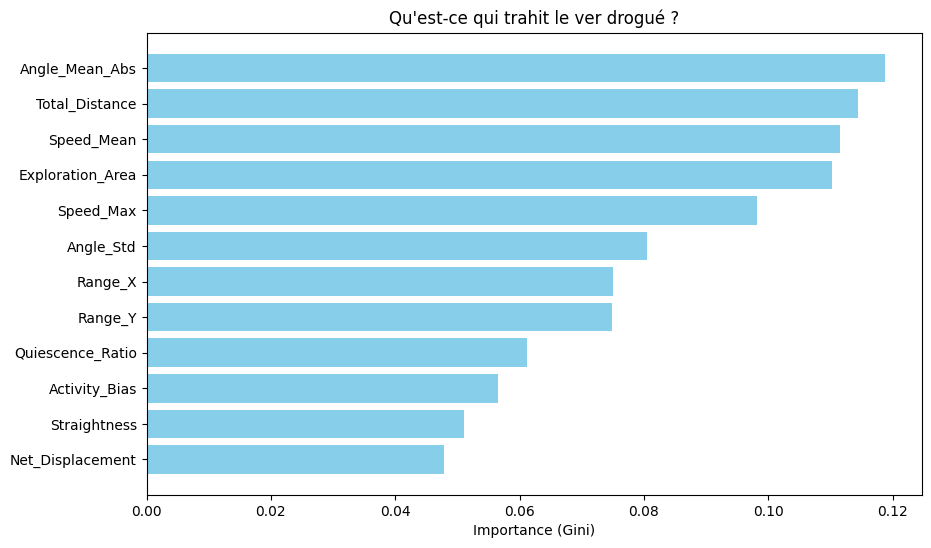

             Feature  Importance
3     Angle_Mean_Abs    0.118722
6     Total_Distance    0.114373
0         Speed_Mean    0.111474
8   Exploration_Area    0.110180
1          Speed_Max    0.098180
4          Angle_Std    0.080549
9            Range_X    0.075084
10           Range_Y    0.074803
2   Quiescence_Ratio    0.061181
11     Activity_Bias    0.056482
7       Straightness    0.051063
5   Net_Displacement    0.047909


In [44]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt

def extract_manual_features(X_data):
    """
    Transforme (N, 4, 150) en (N, 12) features scalaires.
    """
    features = []
    feature_names = [
        "Speed_Mean", "Speed_Max", "Quiescence_Ratio",
        "Angle_Mean_Abs", "Angle_Std",
        "Net_Displacement", "Total_Distance", "Straightness",
        "Exploration_Area", "Range_X", "Range_Y", "Activity_Bias"
    ]
    
    print("Calcul des features manuelles en cours...")
    
    for clip in X_data:
        # Découpage des canaux
        speed = clip[0]
        angle = clip[1]
        x = clip[2]
        y = clip[3]
        
        row = []
        
        # --- 1. DYNAMIQUE (Vitesse/Angle) ---
        row.append(np.mean(speed))              # Speed_Mean
        row.append(np.max(speed))               # Speed_Max
        # Quiescence : % du temps où vitesse < 5 (ajuste le seuil selon tes histogrammes)
        row.append(np.mean(speed < 5))          # Quiescence_Ratio
        
        row.append(np.mean(np.abs(angle)))      # Angle_Mean_Abs (Agitation)
        row.append(np.std(angle))               # Angle_Std
        
        # --- 2. TRAJECTOIRE (X/Y) ---
        # Déplacement net (Start -> End)
        start, end = np.array([x[0], y[0]]), np.array([x[-1], y[-1]])
        net_disp = np.linalg.norm(end - start)
        row.append(net_disp)                    # Net_Displacement
        
        # Distance totale parcourue (somme des pas)
        # On recalcule les dx, dy locaux
        d_steps = np.sqrt(np.diff(x)**2 + np.diff(y)**2)
        total_dist = np.sum(d_steps)
        row.append(total_dist)                  # Total_Distance
        
        # Straightness (Efficacité) : 1 = Ligne droite, 0 = Surplace
        if total_dist > 0:
            row.append(net_disp / total_dist)   # Straightness
        else:
            row.append(0)
            
        # Aire explorée (Convex Hull)
        points = np.column_stack((x, y))
        try:
            if len(points) > 2 and np.std(x) > 0.01 and np.std(y) > 0.01:
                hull = ConvexHull(points)
                row.append(hull.volume)         # Exploration_Area
            else:
                row.append(0)
        except:
            row.append(0)
            
        # Box (Range)
        row.append(np.max(x) - np.min(x))       # Range_X
        row.append(np.max(y) - np.min(y))       # Range_Y
        
        # Activity Bias (Est-ce qu'il bouge plus en X ou en Y ?)
        # Peut indiquer un biais sensoriel
        range_x = np.max(x) - np.min(x)
        range_y = np.max(y) - np.min(y)
        row.append(range_x / (range_y + 0.001)) # Activity_Bias
        
        features.append(row)
        
    return np.array(features), feature_names

# --- 3. TRAINING LOOP ---

# A. Extraction
X_tabular, feat_names = extract_manual_features(X_full)
print(f"Features extraites : {X_tabular.shape}")

# B. Modèle Random Forest
rf = XGBClassifier(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
sgkf = StratifiedGroupKFold(n_splits=5, random_state=42, shuffle=True)

acc_scores = []
worm_acc_scores = []
feature_importances = np.zeros(len(feat_names))

print("\n--- Démarrage Random Forest ---")

for i, (train_idx, val_idx) in enumerate(sgkf.split(X_tabular, y, groups=groups)):
    X_train, X_val = X_tabular[train_idx], X_tabular[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]
    groups_val = groups[val_idx]
    
    # Fit
    rf.fit(X_train, y_train)
    
    # Predict Clips
    preds = rf.predict(X_val)
    acc = accuracy_score(y_val, preds)
    acc_scores.append(acc)
    
    # Feature Importance (Cumulée)
    feature_importances += rf.feature_importances_
    
    # Predict Vers (Vote)
    worm_preds = []
    worm_trues = []
    for wid in np.unique(groups_val):
        idx = np.where(groups_val == wid)[0]
        vote = np.mean(preds[idx])
        worm_preds.append(1 if vote > 0.5 else 0)
        worm_trues.append(y_val[idx[0]])
    
    w_acc = accuracy_score(worm_trues, worm_preds)
    worm_acc_scores.append(w_acc)
    
    print(f"Fold {i+1} : Clip Acc={acc:.2%}, Ver Acc={w_acc:.2%}")

# --- 4. RÉSULTATS & INTERPRÉTATION ---
print(f"\nMoyenne Ver Accuracy : {np.mean(worm_acc_scores):.2%}")

# Affichage de l'importance des variables
feature_importances /= 5 # Moyenne sur les 5 folds
imp_df = pd.DataFrame({'Feature': feat_names, 'Importance': feature_importances})
imp_df = imp_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(imp_df['Feature'], imp_df['Importance'], color='skyblue')
plt.gca().invert_yaxis()
plt.title("Qu'est-ce qui trahit le ver drogué ?")
plt.xlabel("Importance (Gini)")
plt.show()

print(imp_df)

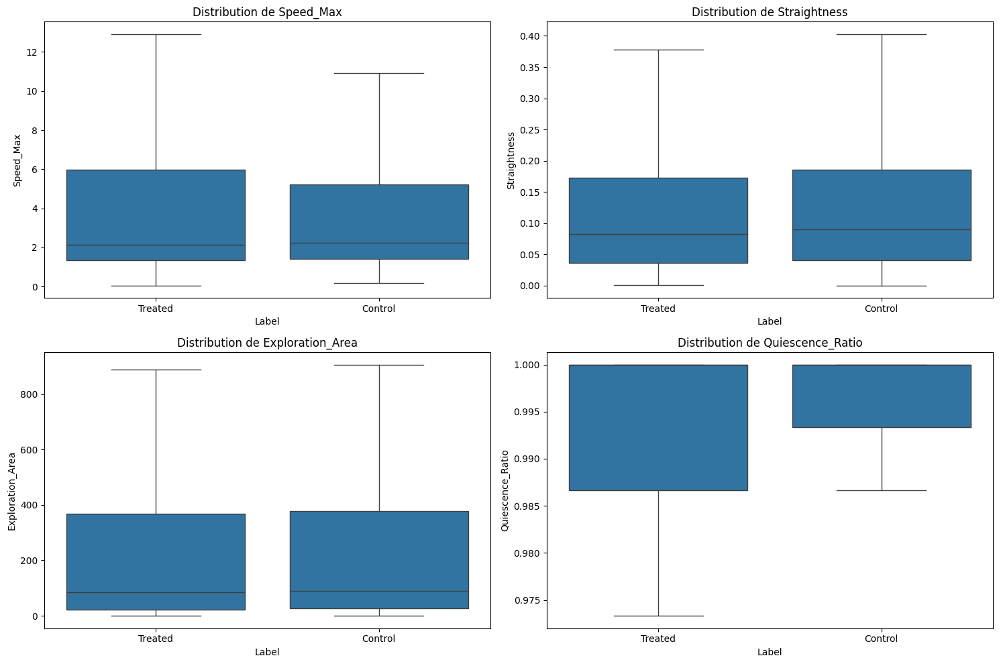

--- MOYENNES PAR GROUPE ---
         Speed_Max  Straightness  Exploration_Area  Quiescence_Ratio
Label                                                               
Control   3.764150      0.134811       1496.493482          0.989447
Treated   3.856147      0.128129       1453.291445          0.988101


In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Création d'un DataFrame lisible
# feat_names doit correspondre à l'ordre de tes colonnes dans X_tabular
# (Speed_Mean, Speed_Max, Quiescence, Angle_Mean, Angle_Std, Net_Disp, Total_Dist, Straightness, Area, Range_X, Range_Y, Bias)
df_viz = pd.DataFrame(X_tabular, columns=feat_names)
df_viz['Label'] = ['Treated' if label==1 else 'Control' for label in y_young]

# 2. Affichage des Boxplots pour les features clés
features_to_check = ['Speed_Max', 'Straightness', 'Exploration_Area', 'Quiescence_Ratio']

plt.figure(figsize=(15, 10))
for i, feat in enumerate(features_to_check):
    plt.subplot(2, 2, i+1)
    sns.boxplot(data=df_viz, x='Label', y=feat, showfliers=False) # showfliers=False cache les points extrêmes pour y voir clair
    plt.title(f"Distribution de {feat}")

plt.tight_layout()
plt.show()

# 3. Affichage des moyennes brutes
print("--- MOYENNES PAR GROUPE ---")
print(df_viz.groupby('Label')[features_to_check].mean())